## Import Libraries

In [350]:
import os
import itertools
from tqdm import tqdm

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Experiment Names and Combinations

In [20]:
configurations = {
    "crossover": {
        "Single Point Crossover": None,
        "Two Point Crossover": None,
        "Uniform Crossover": None,
        "Blend Crossover": None,
        "Arithmetic Crossover": None
    },
    "mutation_rate":{
        "1 Percent": None,
        "5 Percent": None,
        "10 Percent": None,
    },
    "mutation": {
        # "Random Resetting Mutation": lambda individual, mutation_rate: random_resetting_mutation(individual=individual, mutation_rate=mutation_rate),
        "Creep Mutation": None,
        "Gaussian Mutation": None,
        # "Boundary Mutation": lambda individual, mutation_rate: boundary_mutation(individual=individual, mutation_rate=mutation_rate),
        "Uniform Mutation": None
    },
    "selection": {
        "Roulette Wheel Selection": None,
        "Binary Tournament Selection": None,
        "Ternary Tournament Selection": None,
        "Rank Selection": None,
        "Stochastic Universal Selection": None,
        "Elitism Selection": None
    },
    "survivor_selection": {
        "Truncation Survivor Selection": None,
        "Steady State Selection": None
    }
}


In [21]:
def generate_experiment_combinations(configurations):
    # Extract the keys and values for each configuration category
    categories = {k: list(configurations[k].items()) for k in configurations}

    # Generate all possible combinations using itertools.product
    all_combinations = itertools.product(*categories.values())

    experiment_names = []
    experiment_functions = []

    for combination in all_combinations:
        # Create the experiment name by concatenating the keys with ' + '
        experiment_name = ' + '.join([c[0] for c in combination])
        experiment_names.append(experiment_name)

        # Collect the corresponding functions and their parameters
        experiment_funcs = [c[1] for c in combination]
        experiment_functions.append(experiment_funcs)

    return experiment_names, experiment_functions

experiment_names, experiment_functions = generate_experiment_combinations(configurations)
short_experiment_names = [ f"Combination_Experiment_{name}" for name in range(1, len(experiment_names)+1)]

In [362]:
experiment_name_dict = dict(zip(short_experiment_names, experiment_names))

In [97]:
def process_experiment_name(experiment_name):
    # Split the string using '+' and strip whitespace
    parts = [part.strip() for part in experiment_name.split('+')]

    # Initialize the dictionary
    experiment_dict = {
        "Crossover": None,
        "Mutation Rate": None,
        "Mutation": None,
        "Selection": None,
        "Survivor Selection": None
    }

    # Assign each part to its respective category
    for part in parts:
        if "Crossover" in part:
            experiment_dict["Crossover"] = part
        elif "Percent" in part:
            # Remove 'Percent', convert to float, and divide by 100
            mutation_rate = float(part.replace('Percent', '').strip()) / 100
            experiment_dict["Mutation Rate"] = mutation_rate
        elif "Mutation" in part and "Percent" not in part:
            experiment_dict["Mutation"] = part
        elif ("Selection" in part and "Survivor" not in part) and ("State" not in part):
            experiment_dict["Selection"] = part
        elif ("Survivor" in part) or ("State" in part):
            experiment_dict["Survivor Selection"] = part

    return experiment_dict

In [98]:
len(experiment_names)

540

In [99]:
experiment_names[1]

'Single Point Crossover + 1 Percent + Creep Mutation + Roulette Wheel Selection + Steady State Selection'

In [100]:
process_experiment_name(experiment_names[1])

{'Crossover': 'Single Point Crossover',
 'Mutation Rate': 0.01,
 'Mutation': 'Creep Mutation',
 'Selection': 'Roulette Wheel Selection',
 'Survivor Selection': 'Steady State Selection'}

## Create Base Data

In [444]:
df = pd.DataFrame({"Experiment Name":short_experiment_names, "Configuration":experiment_names})

In [445]:
df_processed = df['Configuration'].apply(process_experiment_name)
df_processed = pd.json_normalize(df_processed)

In [446]:
base_df = pd.concat([df, df_processed], axis=1)
base_df = base_df.drop(["Configuration"], axis=1)

In [447]:
base_df

,Experiment Name,Crossover,Mutation Rate,Mutation,Selection,Survivor Selection
0,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection
1,Combination_Experiment_2,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Steady State Selection
2,Combination_Experiment_3,Single Point Crossover,0.01,Creep Mutation,Binary Tournament Selection,Truncation Survivor Selection
3,Combination_Experiment_4,Single Point Crossover,0.01,Creep Mutation,Binary Tournament Selection,Steady State Selection
4,Combination_Experiment_5,Single Point Crossover,0.01,Creep Mutation,Ternary Tournament Selection,Truncation Survivor Selection
...,...,...,...,...,...,...
535,Combination_Experiment_536,Arithmetic Crossover,0.10,Uniform Mutation,Rank Selection,Steady State Selection
536,Combination_Experiment_537,Arithmetic Crossover,0.10,Uniform Mutation,Stochastic Universal Selection,Truncation Survivor Selection
537,Combination_Experiment_538,Arithmetic Crossover,0.10,Uniform Mutation,Stochastic Universal Selection,Steady State Selection
538,Combination_Experiment_539,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Truncation Survivor Selection


## Generation Based Statistics

In [448]:
Experiments = df["Experiment Name"].to_list()

In [449]:
def get_file_from_list(file_list, generation):
    target = f"Results_Gen_{generation}_"
    x = [x for x in file_list if target in x]
    if len(x) == 0:
        return np.nan
    return x[0]

In [450]:
get_file_from_list(os.listdir("../RESULTS/Combination_Experiment_1/"), 100)

'Results_Gen_100_20231225_171944.txt'

In [451]:
def get_file_dicts_for_folder(experiment):
    try:
        file_list = os.listdir(f"../RESULTS/{experiment}/")
    except:
        file_list = []
        
    result_dict = {}
    for i in range(1, 101):
        result_dict[i] = get_file_from_list(file_list, i)
        
    return result_dict                           

In [452]:
gen_result_files = get_file_dicts_for_folder(Experiments[1])

In [453]:
# gen_result_files

In [454]:
# Initialize an empty list to store new rows
new_rows = []

# Iterate over each row in df_combined
for index, row in tqdm(base_df.iterrows()):
    # For each generation number and file in the generation_data dictionary
    experiment_name = row["Experiment Name"]
    generation_data = get_file_dicts_for_folder(experiment_name)
    
    for gen_number, gen_file in generation_data.items():
        # Create a new row with the combined data and generation info
        new_row = row.to_dict()
        new_row['Generation Number'] = gen_number
        if gen_file is np.nan:
             new_row['Generation Log File'] = np.nan
        else:
            new_row['Generation Log File'] = f"../RESULTS/{experiment_name}/{gen_file}"
        new_rows.append(new_row)

# Create a new DataFrame from the new rows
df_generation = pd.DataFrame(new_rows)

540it [00:01, 420.73it/s]


In [455]:
df_generation = df_generation.dropna()

In [456]:
df_generation

,Experiment Name,Crossover,Mutation Rate,Mutation,Selection,Survivor Selection,Generation Number,Generation Log File
0,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,1,../RESULTS/Combination_Experiment_1/Results_Ge...
1,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,2,../RESULTS/Combination_Experiment_1/Results_Ge...
2,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,3,../RESULTS/Combination_Experiment_1/Results_Ge...
3,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,4,../RESULTS/Combination_Experiment_1/Results_Ge...
4,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,5,../RESULTS/Combination_Experiment_1/Results_Ge...
...,...,...,...,...,...,...,...,...
53995,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,96,../RESULTS/Combination_Experiment_540/Results_...
53996,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,97,../RESULTS/Combination_Experiment_540/Results_...
53997,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,98,../RESULTS/Combination_Experiment_540/Results_...
53998,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,99,../RESULTS/Combination_Experiment_540/Results_...


In [457]:
def read_experiment_results(file_path: str):
    """
    Reads the experiment results from a text file and extracts genotypes, fitness values, and detailed results.

    Parameters:
    - file_path (str): The path to the results file.

    Returns:
    - Tuple of three elements:
      1. List of genotypes
      2. Dictionary of genotype fitness values
      3. Dictionary of detailed results for each genotype
    """
    genotypes = []
    fitness_values = {}
    detailed_results = {}

    with open(file_path, 'r') as file:
        lines = file.readlines()

        reading_genotypes = False
        reading_detailed_results = False
        current_genotype = None

        for line in lines:
            line = line.strip()

            # Check for sections in the file
            if "Genotypes and their Fitness Values:" in line:
                reading_genotypes = True
                reading_detailed_results = False
                continue
            elif "Detailed Results for Each Genotype:" in line:
                reading_genotypes = False
                reading_detailed_results = True
                continue

            # Process the appropriate section
            if reading_genotypes and '-' in line:
                genotype_str, fitness_str = line.split('- Fitness:')
                genotype = eval(genotype_str.strip())
                fitness = float(fitness_str.strip())
                genotypes.append(genotype)
                fitness_values[tuple(genotype)] = fitness
            elif reading_detailed_results and 'Genotype' in line:
                genotype_str = line.split('Genotype ')[1].split(':')[0].strip()
                current_genotype = eval(genotype_str)
                detailed_results[tuple(current_genotype)] = {}
            elif reading_detailed_results and 'Angle' in line:
                parts = line.split(':')
                angle = int(parts[0].split()[1])
                values_str = parts[1].split(',')
                cl = float(values_str[0].split('=')[1])
                cd = float(values_str[1].split('=')[1])
                cm = float(values_str[2].split('=')[1])
                detailed_results[tuple(current_genotype)][angle] = (cl, cd, cm)

    return genotypes, fitness_values, detailed_results

In [458]:
genotypes, fitness_values, detailed_results = read_experiment_results(df_generation["Generation Log File"].iloc[0])

In [459]:
str(genotypes[0])

'[0.009850677664866372, 0.4409133916170535, 0.1295487342146977, -0.7808051360146988, 0.253436479224651, -0.022716056755466764, 0.10974741654937767, -0.0039984601259599635, 0.004301339473160307, 8.794923268059222, 10.88010326978484]'

In [460]:
fitness_values[tuple(genotypes[0])]

-0.709099026747874

In [461]:
detailed_results[tuple(genotypes[0])]
# detailed_results.values()

{-10: (-0.5367875099182129, 0.19459985196590424, -0.17556194961071014),
 -9: (-0.5796747207641602, 0.16981622576713562, -0.1671973615884781),
 -8: (-0.6098834872245789, 0.14074069261550903, -0.16190241277217865),
 -7: (-0.6330243349075317, 0.11831288784742355, -0.15306957066059113),
 -6: (-0.6265453100204468, 0.10450922697782516, -0.13153846561908722),
 -5: (-0.545254647731781, 0.0943913459777832, -0.10635118186473846),
 -4: (-0.4622024595737457, 0.08663022518157959, -0.08236844837665558),
 -3: (-0.38016271591186523, 0.08171126246452332, -0.058460935950279236),
 -2: (-0.3191322982311249, 0.0875745415687561, -0.04131166636943817),
 -1: (-0.27213650941848755, 0.09481785446405411, -0.023743048310279846),
 0: (-0.21395453810691833, 0.10151425004005432, -0.006923899054527283),
 1: (-0.14427490532398224, 0.10770045965909958, 0.007953748106956482),
 2: (0.0223616361618042, 0.10413671284914017, 0.015959948301315308),
 3: (0.11378009617328644, 0.1057182103395462, 0.015352055430412292),
 4: (0.1

In [462]:
# genotypes[0]

In [463]:
# list(fitness_values.values())

In [464]:
def get_fitness_stats(experiment_file):
    genotypes, fitness_values, detailed_result = read_experiment_results(experiment_file)
    
    fitness_values = list(fitness_values.values())

    # Compute the statistics as shown above
    best_fitness = np.max(fitness_values)
    lowest_fitness = np.min(fitness_values)
    average_fitness = np.mean(fitness_values)
    std_dev_fitness = np.std(fitness_values)
    median_fitness = np.median(fitness_values)
    
    return best_fitness, lowest_fitness, average_fitness, std_dev_fitness, median_fitness

In [465]:
%%time
get_fitness_stats(df_generation["Generation Log File"].iloc[0])

CPU times: total: 0 ns
Wall time: 11.5 ms


(-0.709099026747874,
 -2.1715093604877564,
 -1.7571522461664144,
 0.33894842771971617,
 -1.8810802473780226)

In [466]:
# Define a function that takes a row and returns a Series with the fitness statistics
def fitness_stats_row(row):
    file_path = row['Generation Log File']
    best_fitness, lowest_fitness, average_fitness, std_dev_fitness, median_fitness = get_fitness_stats(file_path)
    return pd.Series([best_fitness, lowest_fitness, average_fitness, std_dev_fitness, median_fitness])

In [467]:
fitness_stats_list = []

# Iterate over each row in the DataFrame with tqdm
for _, row in tqdm(df_generation.iterrows(), total=df_generation.shape[0], desc="Processing rows"):
    fitness_stats = fitness_stats_row(row)
    # Append the results to the list
    fitness_stats_list.append(fitness_stats)

Processing rows: 100%|███████████████████████████████████████████████████| 26740/26740 [07:26<00:00, 59.90it/s]


In [468]:
# Create the DataFrame from the collected statistics
fitness_stats_df = pd.DataFrame(fitness_stats_list,)
fitness_stats_df.columns = ['Best Fitness', 'Lowest Fitness', 'Average Fitness', 'Standard Deviation Fitness', 'Median Fitness']

# Combine the original DataFrame with the new fitness stats DataFrame
df_combined = pd.concat([df_generation.reset_index(drop=True), fitness_stats_df], axis=1)

In [489]:
# Display the combined DataFrame
df_combined

,Experiment Name,Crossover,Mutation Rate,Mutation,Selection,Survivor Selection,Generation Number,Generation Log File,Best Fitness,Lowest Fitness,Average Fitness,Standard Deviation Fitness,Median Fitness
0,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,1,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.709099,-2.171509,-1.757152,0.338948,-1.881080
1,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,2,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.664416,-1.880508,-1.557737,0.311080,-1.698041
2,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,3,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.664416,-1.613202,-1.297397,0.247769,-1.326137
3,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,4,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.538296,-1.326752,-1.071519,0.206682,-1.144199
4,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,5,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.442628,-1.130396,-0.901424,0.154906,-0.917703
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26735,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,96,../RESULTS/Combination_Experiment_540/Results_...,-0.127325,-0.304579,-0.194184,0.026614,-0.192258
26736,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,97,../RESULTS/Combination_Experiment_540/Results_...,-0.127325,-0.266570,-0.188644,0.024198,-0.188179
26737,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,98,../RESULTS/Combination_Experiment_540/Results_...,-0.127325,-0.366650,-0.187262,0.035781,-0.183690
26738,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,99,../RESULTS/Combination_Experiment_540/Results_...,-0.092838,-0.282473,-0.181845,0.035911,-0.178872


## Best Generation based Fitness

In [470]:
df_combined.sort_values(by="Best Fitness", ascending=False).drop_duplicates(subset="Experiment Name", keep='first')

,Experiment Name,Crossover,Mutation Rate,Mutation,Selection,Survivor Selection,Generation Number,Generation Log File,Best Fitness,Lowest Fitness,Average Fitness,Standard Deviation Fitness,Median Fitness
8260,Combination_Experiment_351,Blend Crossover,0.01,Uniform Mutation,Binary Tournament Selection,Truncation Survivor Selection,100,../RESULTS/Combination_Experiment_351/Results_...,2.765205,2.739503,2.747831,0.005623,2.747006
1293,Combination_Experiment_13,Single Point Crossover,0.01,Gaussian Mutation,Roulette Wheel Selection,Truncation Survivor Selection,94,../RESULTS/Combination_Experiment_13/Results_G...,0.291821,0.290389,0.291105,0.000716,0.291105
1946,Combination_Experiment_20,Single Point Crossover,0.01,Gaussian Mutation,Rank Selection,Steady State Selection,47,../RESULTS/Combination_Experiment_20/Results_G...,0.291821,0.237290,0.271126,0.013075,0.269909
1699,Combination_Experiment_17,Single Point Crossover,0.01,Gaussian Mutation,Ternary Tournament Selection,Truncation Survivor Selection,100,../RESULTS/Combination_Experiment_17/Results_G...,0.291821,0.283992,0.287821,0.003293,0.287884
1477,Combination_Experiment_15,Single Point Crossover,0.01,Gaussian Mutation,Binary Tournament Selection,Truncation Survivor Selection,78,../RESULTS/Combination_Experiment_15/Results_G...,0.291821,0.291088,0.291454,0.000367,0.291454
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17320,Combination_Experiment_442,Arithmetic Crossover,0.01,Creep Mutation,Stochastic Universal Selection,Steady State Selection,60,../RESULTS/Combination_Experiment_442/Results_...,-1.133706,-1.156735,-1.147796,0.007123,-1.148458
5754,Combination_Experiment_238,Uniform Crossover,0.01,Gaussian Mutation,Stochastic Universal Selection,Steady State Selection,55,../RESULTS/Combination_Experiment_238/Results_...,-1.137692,-1.190616,-1.156631,0.010466,-1.155207
17251,Combination_Experiment_441,Arithmetic Crossover,0.01,Creep Mutation,Stochastic Universal Selection,Truncation Survivor Selection,91,../RESULTS/Combination_Experiment_441/Results_...,-1.137779,-1.172064,-1.156769,0.009829,-1.157193
7747,Combination_Experiment_346,Blend Crossover,0.01,Gaussian Mutation,Stochastic Universal Selection,Steady State Selection,87,../RESULTS/Combination_Experiment_346/Results_...,-1.144124,-1.160560,-1.152908,0.004675,-1.154670


In [286]:
df_combined.to_csv("./assets/generation_fitness.csv", index=False)

## Generation Based Angle of Attack Analysis

In [471]:
def get_aoa_measurement_stats_dict(experiment_file):
    genotypes, fitness_values, detailed_result = read_experiment_results(experiment_file)
    dicts_list = list(detailed_result.values())
    
    measurements = {
        angle: {'CL': [], 'CD': [], 'CM': []} for angle in range(-10, 11)
    }

    # Accumulate values from each dictionary in the list
    for d in dicts_list:
        for angle, (cl, cd, cm) in d.items():
            measurements[angle]['CL'].append(cl)
            measurements[angle]['CD'].append(cd)
            measurements[angle]['CM'].append(cm)

    # Prepare data for the final dictionary
    final_stats = {}
    for angle in range(-10, 11):
        for measure_type in ['CL', 'CD', 'CM']:
            values = measurements[angle][measure_type]
            final_stats[f'Angle {angle} {measure_type} Mean'] = np.mean(values)
            final_stats[f'Angle {angle} {measure_type} Max'] = np.max(values)
            final_stats[f'Angle {angle} {measure_type} Median'] = np.median(values)
            final_stats[f'Angle {angle} {measure_type} Std Dev'] = np.std(values)
            final_stats[f'Angle {angle} {measure_type} Min'] = np.min(values)

    return final_stats

In [472]:
%%time
sample_dict = get_aoa_measurement_stats_dict(df_generation["Generation Log File"].iloc[0])
len(sample_dict)

CPU times: total: 0 ns
Wall time: 18.1 ms


315

In [473]:
aoa_stats_list = []

# Iterate over each row in the DataFrame with tqdm
for _, row in tqdm(df_combined.iterrows(), total=df_combined.shape[0], desc="Processing rows"):
    aoa_stats = get_aoa_measurement_stats_dict(row["Generation Log File"])
    # Append the results to the list
    aoa_stats_list.append(aoa_stats)

Processing rows: 100%|███████████████████████████████████████████████████| 26740/26740 [06:50<00:00, 65.21it/s]


In [474]:
# Create the DataFrame from the collected statistics
aoa_stats_df = pd.DataFrame(aoa_stats_list)
aoa_stats_df.columns = list(sample_dict.keys())

# Combine the original DataFrame with the new fitness stats DataFrame
df_full_combined = pd.concat([df_generation.reset_index(drop=True), aoa_stats_df], axis=1)

In [475]:
df_full_combined

,Experiment Name,Crossover,Mutation Rate,Mutation,Selection,Survivor Selection,Generation Number,Generation Log File,Angle -10 CL Mean,Angle -10 CL Max,...,Angle 10 CD Mean,Angle 10 CD Max,Angle 10 CD Median,Angle 10 CD Std Dev,Angle 10 CD Min,Angle 10 CM Mean,Angle 10 CM Max,Angle 10 CM Median,Angle 10 CM Std Dev,Angle 10 CM Min
0,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,1,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.597010,-0.536788,...,0.103422,0.120719,0.102373,0.004197,0.098830,-0.143825,-0.015588,-0.143599,0.053236,-0.280391
1,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,2,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.585426,-0.536788,...,0.102738,0.110802,0.102023,0.002346,0.098967,-0.120349,-0.015588,-0.121428,0.041906,-0.222822
2,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,3,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.578159,-0.536788,...,0.103667,0.111391,0.103328,0.002726,0.099613,-0.092790,-0.006024,-0.104323,0.036951,-0.166879
3,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,4,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.573267,-0.536788,...,0.105286,0.112437,0.104104,0.003204,0.100804,-0.072608,-0.005813,-0.075632,0.038511,-0.146172
4,Combination_Experiment_1,Single Point Crossover,0.01,Creep Mutation,Roulette Wheel Selection,Truncation Survivor Selection,5,../RESULTS/Combination_Experiment_1/Results_Ge...,-0.569276,-0.536788,...,0.107159,0.112437,0.107553,0.003574,0.101101,-0.050819,-0.005813,-0.053485,0.033230,-0.110576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26735,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,96,../RESULTS/Combination_Experiment_540/Results_...,-0.543345,-0.540680,...,0.112645,0.113862,0.112675,0.000495,0.110930,-0.022342,-0.014509,-0.022105,0.002881,-0.031395
26736,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,97,../RESULTS/Combination_Experiment_540/Results_...,-0.543461,-0.541289,...,0.112723,0.113862,0.112779,0.000477,0.111332,-0.022135,-0.014509,-0.021978,0.003054,-0.031955
26737,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,98,../RESULTS/Combination_Experiment_540/Results_...,-0.543333,-0.541649,...,0.112714,0.113862,0.112816,0.000767,0.109248,-0.022138,-0.014509,-0.021692,0.004577,-0.040291
26738,Combination_Experiment_540,Arithmetic Crossover,0.10,Uniform Mutation,Elitism Selection,Steady State Selection,99,../RESULTS/Combination_Experiment_540/Results_...,-0.543483,-0.540966,...,0.112895,0.113980,0.112934,0.000575,0.111051,-0.020903,-0.013050,-0.020951,0.003672,-0.030892


In [476]:
df_full_combined.to_csv("./assets/generation_fitness_and_aoa.csv", index=False)

## Experiment Based Statistics

In [490]:
def get_experiment_assets(experiment_name):
    log_files = list(get_file_dicts_for_folder(experiment_name).values())
    log_file_paths = [f"../RESULTS/{experiment_name}/{x}" for x in log_files]
    
    genotypes, fitness_values, detailed_results = [], {}, {}
    
    for file in log_file_paths:
        g, f, d = read_experiment_results(file)
        genotypes.extend(g)
        fitness_values = {**fitness_values, **f}
        detailed_results = {**detailed_results, **d}
    
    return genotypes, fitness_values, detailed_results

In [491]:
%%time
genotypes, fitness_values, detailed_results = get_experiment_assets(Experiments[0])

CPU times: total: 672 ms
Wall time: 990 ms


In [492]:
def get_experiment_fitness_stats(experiment_name):
    genotypes, fitness_values, detailed_result = get_experiment_assets(experiment_name)
    
    fitness_values = list(fitness_values.values())

    # Compute the statistics as shown above
    best_fitness = np.max(fitness_values)
    lowest_fitness = np.min(fitness_values)
    average_fitness = np.mean(fitness_values)
    std_dev_fitness = np.std(fitness_values)
    median_fitness = np.median(fitness_values)
    
    return best_fitness, lowest_fitness, average_fitness, std_dev_fitness, median_fitness

In [493]:
%%time
get_experiment_fitness_stats(Experiments[0])

CPU times: total: 609 ms
Wall time: 891 ms


(0.1795747752690384,
 -2.1715093604877564,
 -0.48480516247256356,
 0.6337861847438229,
 -0.22995283583886844)

In [494]:
# Define a function that takes a row and returns a Series with the fitness statistics
def fitness_experiment_stats_row(row):
    file_path = row['Experiment Name']
    best_fitness, lowest_fitness, average_fitness, std_dev_fitness, median_fitness = get_experiment_fitness_stats(file_path)
    return pd.Series([best_fitness, lowest_fitness, average_fitness, std_dev_fitness, median_fitness])

In [495]:
# fitness_ex_stats_list = []

# # Iterate over each row in the DataFrame with tqdm
# for _, row in tqdm(df_generation.iterrows(), total=df_generation.shape[0], desc="Processing rows"):
#     fitness_stats = fitness_experiment_stats_row(row)
#     # Append the results to the list
#     fitness_ex_stats_list.append(fitness_stats)

In [483]:
# # Create the DataFrame from the collected statistics
# fitness_ex_stats_df = pd.DataFrame(fitness_stats_list,)
# fitness_ex_stats_df.columns = ['Best Fitness', 'Lowest Fitness', 'Average Fitness', 'Standard Deviation Fitness', 'Median Fitness']

# # Combine the original DataFrame with the new fitness stats DataFrame
# df_ex_combined = pd.concat([df_generation.reset_index(drop=True), fitness_ex_stats_df], axis=1)

In [484]:
# # Display the combined DataFrame
# df_ex_combined

In [496]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26740 entries, 0 to 26739
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Experiment Name             26740 non-null  object 
 1   Crossover                   26740 non-null  object 
 2   Mutation Rate               26740 non-null  float64
 3   Mutation                    26740 non-null  object 
 4   Selection                   26740 non-null  object 
 5   Survivor Selection          26740 non-null  object 
 6   Generation Number           26740 non-null  int64  
 7   Generation Log File         26740 non-null  object 
 8   Best Fitness                26740 non-null  float64
 9   Lowest Fitness              26740 non-null  float64
 10  Average Fitness             26740 non-null  float64
 11  Standard Deviation Fitness  26740 non-null  float64
 12  Median Fitness              26740 non-null  float64
dtypes: float64(6), int64(1), object

In [497]:
# Group the DataFrame by 'Experiment Name'
grouped = df_combined.groupby('Experiment Name')

# Calculate aggregate statistics for each group
experiment_stats = grouped.agg({
    'Best Fitness': 'max',
    'Lowest Fitness': 'min',
    'Average Fitness': 'mean',
    'Standard Deviation Fitness': 'mean',
    'Median Fitness': 'median'
}).reset_index()

# Optionally, sort the DataFrame based on a specific column (e.g., 'Best Fitness')
experiment_stats_sorted = experiment_stats.sort_values(by='Best Fitness', ascending=False)

experiment_stats_sorted

,Experiment Name,Best Fitness,Lowest Fitness,Average Fitness,Standard Deviation Fitness,Median Fitness
61,Combination_Experiment_351,2.765205,-2.091331,1.929061,0.035425,2.243207
4,Combination_Experiment_13,0.291821,-2.316307,0.043316,0.032609,0.262099
6,Combination_Experiment_15,0.291821,-2.067294,0.154890,0.021886,0.283387
8,Combination_Experiment_17,0.291821,-2.097023,0.155020,0.022199,0.275282
12,Combination_Experiment_20,0.291821,-2.584654,0.059409,0.075703,0.278912
...,...,...,...,...,...,...
162,Combination_Experiment_442,-1.133706,-1.183958,-1.149134,0.007818,-1.148419
23,Combination_Experiment_238,-1.137692,-1.207091,-1.156722,0.009768,-1.155207
161,Combination_Experiment_441,-1.137779,-1.194694,-1.157492,0.010140,-1.157965
55,Combination_Experiment_346,-1.144124,-1.200479,-1.159850,0.008066,-1.159113


In [487]:
len(list(df_full_combined.columns))

323

In [498]:
columns = df_full_combined.columns

# Define a dictionary to map column suffixes to aggregation functions
agg_funcs_mapping = {
    'Mean': 'mean',
    'Max': 'max',
    'Median': 'median',
    'Std Dev': 'std',
    'Min': 'min'
}

# Create a dictionary for aggregation functions for each column
agg_funcs = {}
for col in columns:
    for suffix, func in agg_funcs_mapping.items():
        if suffix in col:
            agg_funcs[col] = func
            break  # Break the loop once a match is found

# Group the DataFrame by 'Experiment Name' and apply the aggregation
grouped = df_full_combined.groupby('Experiment Name')
detailed_experiment_stats = grouped.agg(agg_funcs).reset_index()

detailed_experiment_stats

,Experiment Name,Angle -10 CL Mean,Angle -10 CL Max,Angle -10 CL Median,Angle -10 CL Std Dev,Angle -10 CL Min,Angle -10 CD Mean,Angle -10 CD Max,Angle -10 CD Median,Angle -10 CD Std Dev,...,Angle 10 CD Mean,Angle 10 CD Max,Angle 10 CD Median,Angle 10 CD Std Dev,Angle 10 CD Min,Angle 10 CM Mean,Angle 10 CM Max,Angle 10 CM Median,Angle 10 CM Std Dev,Angle 10 CM Min
0,Combination_Experiment_1,-0.561058,-0.531322,-0.559860,0.004677,-0.650933,0.224533,0.233214,0.226045,0.002072,...,0.110607,0.120719,0.111124,0.000862,0.098830,-0.013231,-0.004263,-0.008122,0.010047,-0.280391
1,Combination_Experiment_10,-0.625255,-0.548692,-0.623589,0.001774,-0.741821,0.194526,0.275764,0.191066,0.001704,...,0.108491,0.134029,0.104773,0.000372,0.099698,-0.204331,-0.086689,-0.201193,0.002256,-0.391234
2,Combination_Experiment_11,-0.563871,-0.527037,-0.562930,0.004584,-0.640335,0.229469,0.235349,0.234953,0.002334,...,0.110053,0.121434,0.110995,0.000817,0.098388,-0.014542,-0.003809,-0.004193,0.010066,-0.298555
3,Combination_Experiment_12,-0.562653,-0.529226,-0.561726,0.008283,-0.727808,0.223151,0.283793,0.234131,0.003437,...,0.109347,0.137025,0.109974,0.001158,0.098534,-0.022904,0.005469,-0.004543,0.015267,-0.414701
4,Combination_Experiment_13,-0.563755,-0.537135,-0.566968,0.005070,-0.679256,0.226965,0.235510,0.234486,0.001898,...,0.110561,0.126739,0.110929,0.000982,0.098318,-0.015739,-0.003658,-0.004274,0.010223,-0.339931
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263,Combination_Experiment_540,-0.545383,-0.533583,-0.540911,0.005141,-0.678106,0.202016,0.219509,0.200386,0.000759,...,0.106616,0.120552,0.104756,0.000724,0.095823,-0.060839,-0.013050,-0.060264,0.008693,-0.290879
264,Combination_Experiment_6,-0.556496,-0.519523,-0.558920,0.004761,-0.648815,0.222747,0.226739,0.226532,0.001865,...,0.113545,0.116826,0.114777,0.000920,0.100543,-0.014760,0.001247,-0.007693,0.007867,-0.275074
265,Combination_Experiment_7,-0.559948,-0.533494,-0.561668,0.003443,-0.647883,0.221983,0.231565,0.219367,0.001899,...,0.111877,0.113770,0.112125,0.000513,0.099726,-0.016488,-0.005519,-0.012043,0.006459,-0.241967
266,Combination_Experiment_8,-0.564405,-0.534613,-0.563825,0.005736,-0.700853,0.227994,0.239629,0.233031,0.003029,...,0.109587,0.125206,0.109780,0.001011,0.099287,-0.014671,0.004491,-0.005048,0.011392,-0.322895


## Data Visualization

In [499]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26740 entries, 0 to 26739
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Experiment Name             26740 non-null  object 
 1   Crossover                   26740 non-null  object 
 2   Mutation Rate               26740 non-null  float64
 3   Mutation                    26740 non-null  object 
 4   Selection                   26740 non-null  object 
 5   Survivor Selection          26740 non-null  object 
 6   Generation Number           26740 non-null  int64  
 7   Generation Log File         26740 non-null  object 
 8   Best Fitness                26740 non-null  float64
 9   Lowest Fitness              26740 non-null  float64
 10  Average Fitness             26740 non-null  float64
 11  Standard Deviation Fitness  26740 non-null  float64
 12  Median Fitness              26740 non-null  float64
dtypes: float64(6), int64(1), object

In [500]:
def get_max_fitness_by_generation(df, experiment_names):
    # Filter the DataFrame for the given experiment names
    filtered_df = df[df['Experiment Name'].isin(experiment_names)]

    # Group by 'Experiment Name' and 'Generation Number', then get the max 'Best Fitness'
    grouped = filtered_df.groupby(['Experiment Name', 'Generation Number'])['Best Fitness'].max()

    # Reset the index to turn it back to a DataFrame
    result_df = grouped.reset_index()

    # Sort the DataFrame by 'Experiment Name' and 'Generation Number'
    sorted_result_df = result_df.sort_values(by=['Experiment Name', 'Generation Number'])

    return sorted_result_df

In [501]:
fitnerss_based_df = get_max_fitness_by_generation(df_combined, [Experiments[0]])

In [502]:
fitnerss_based_df

,Experiment Name,Generation Number,Best Fitness
0,Combination_Experiment_1,1,-0.709099
1,Combination_Experiment_1,2,-0.664416
2,Combination_Experiment_1,3,-0.664416
3,Combination_Experiment_1,4,-0.538296
4,Combination_Experiment_1,5,-0.442628
...,...,...,...
95,Combination_Experiment_1,96,0.178911
96,Combination_Experiment_1,97,0.179548
97,Combination_Experiment_1,98,0.179548
98,Combination_Experiment_1,99,0.179575


In [442]:
def plot_fitness_for_single_experiment(experiment_name):
    fitnerss_based_df = get_max_fitness_by_generation(df_combined, [experiment_name])
    
    plt.figure(figsize=(10, 6))  # Set the size of the plot

    # Create a line plot
    sns.lineplot(data=fitnerss_based_df, x='Generation Number', y='Best Fitness', marker='o',)

    # Adding titles and labels
    plt.title(f'Best Fitness Over Generations for {experiment_name_dict[experiment_name]}')
    plt.xlabel('Generation Number')
    plt.ylabel('Best Fitness')

    # Show the plot
    plt.show()

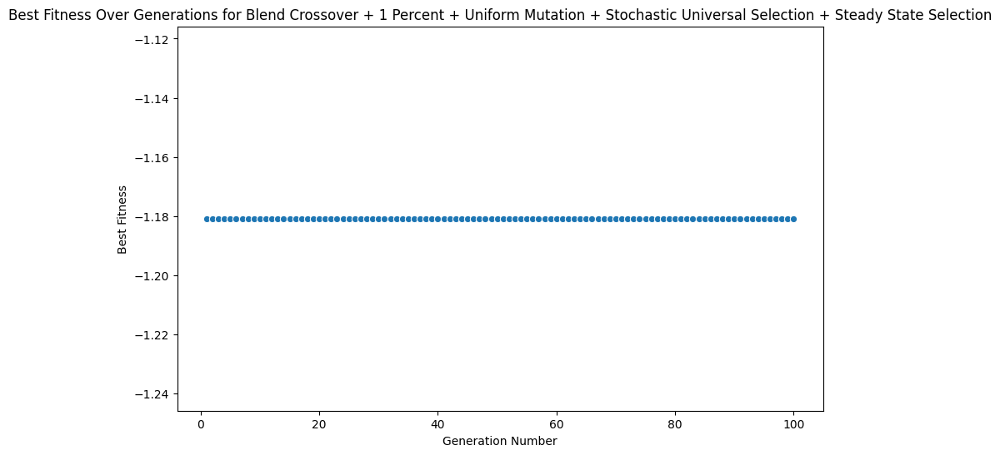

In [552]:
plot_fitness_for_single_experiment(Experiments[357])

In [435]:
short_experiment_names[350]

'Combination_Experiment_351'

In [369]:
def plot_fitness_for_multiple_experiments(experiment_names):
    
    df = df_combined.copy()
    
    # Get the max fitness by generation for the specified experiments
    fitness_based_df = get_max_fitness_by_generation(df, experiment_names)
    
    # Group by 'Experiment Name' and 'Generation Number', then get the max 'Best Fitness'
    fitness_based_df = fitness_based_df.groupby(['Experiment Name', 'Generation Number'])['Best Fitness'].max()

    # Reset the index to turn it back to a DataFrame
    fitness_based_df = fitness_based_df.reset_index()
    
    plt.figure(figsize=(10, 6))  # Set the size of the plot

    # Create a line plot for each experiment
    for experiment_name in experiment_names:
        sns.lineplot(data=fitness_based_df[fitness_based_df['Experiment Name'] == experiment_name], 
                     x='Generation Number', y='Best Fitness', marker='o', label=experiment_name)

    # Adding titles and labels
    plt.title('Best Fitness Over Generations')
    plt.xlabel('Generation Number')
    plt.ylabel('Best Fitness')
    plt.legend(title='Experiment Name')

    # Show the plot
    plt.show()

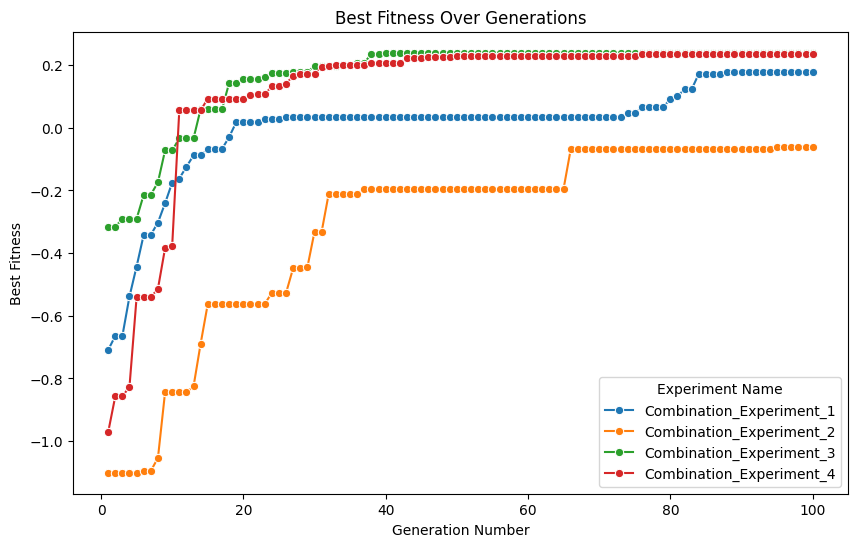

In [376]:
plot_fitness_for_multiple_experiments([Experiments[0], Experiments[1], Experiments[2], Experiments[3]])

In [305]:
def get_experiment_assets(experiment_name):
    log_files = list(get_file_dicts_for_folder(experiment_name).values())
    log_file_paths = [f"../RESULTS/{experiment_name}/{x}" for x in log_files]
    
    genotypes, fitness_values, detailed_results = [], {}, {}
    
    for file in log_file_paths:
        g, f, d = read_experiment_results(file)
        genotypes.extend(g)
        fitness_values = {**fitness_values, **f}
        detailed_results = {**detailed_results, **d}
    
    return genotypes, fitness_values, detailed_results

<Figure size 2000x1800 with 0 Axes>

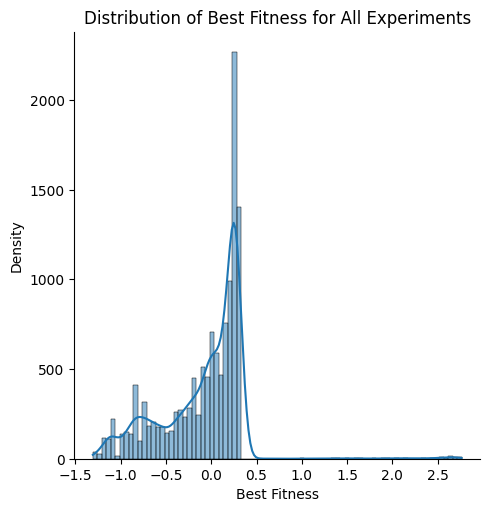

In [388]:
def plot_fitness_distribution(df, fitness_column, experiment_name=None):
    # Filter by experiment name if provided
    if experiment_name is not None:
        df = df[df['Experiment Name'] == experiment_name]

    # Create a distribution plot
    plt.figure(figsize=(20, 18))
    sns.displot(df[fitness_column], kde=True)

    # Adding titles and labels
    plt.title(f'Distribution of {fitness_column} for All Experiments' + (f' for {experiment_name}' if experiment_name else ''))
    plt.xlabel(fitness_column)
    plt.ylabel('Density')

    # Show the plot
    plt.show();

# Example usage
plot_fitness_distribution(df_combined, 'Best Fitness');

In [389]:
def get_experiment_assets(experiment_name):
    log_files = list(get_file_dicts_for_folder(experiment_name).values())
    log_file_paths = [f"../RESULTS/{experiment_name}/{x}" for x in log_files]
    
    genotypes, fitness_values, detailed_results = [], {}, {}
    
    for file in log_file_paths:
        g, f, d = read_experiment_results(file)
        genotypes.extend(g)
        fitness_values = {**fitness_values, **f}
        detailed_results = {**detailed_results, **d}
    
    return genotypes, fitness_values, detailed_results

In [507]:
def df_full_combined_assets(experiment_names):
    genotypes, fitness_values, detailed_results = [], {}, {}
    
    for exp in tqdm(experiment_names):
        try:
            g, f, d = get_experiment_assets(exp)
            genotypes.extend(g)
            fitness_values = {**fitness_values, **f}
            detailed_results = {**detailed_results, **d}
        except:
            pass
    
    return genotypes, fitness_values, detailed_results

In [543]:
genotypes, fitness_values, detailed_results = df_full_combined_assets(list(set(df_combined[df_combined["Experiment Name"] == "Combination_Experiment_358"]["Experiment Name"].to_list())))

100%|████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]


In [544]:
# df_combined[df_combined["Experiment Name"] == "Combination_Experiment_351"]

In [545]:
len(fitness_values)

55

In [546]:
# list(fitness_values.items())[:5]

In [547]:
# Initialize the data dictionary with empty lists for each parameter and fitness
data = {
    'rLE': [], 'Xup': [], 'Yup': [], 'YXXup': [], 'Xlow': [], 'Ylow': [], 'YXXlow': [],
    'yTE': [], 'deltaYTE': [], 'alphaTE': [], 'betaTE': [], 'Fitness': []
}

# Extracting data from the dictionary and appending to the data dictionary
for params, fitness in tqdm(fitness_values.items()):
    data['rLE'].append(params[0])
    data['Xup'].append(params[1])
    data['Yup'].append(params[2])
    data['YXXup'].append(params[3])
    data['Xlow'].append(params[4])
    data['Ylow'].append(params[5])
    data['YXXlow'].append(params[6])
    data['yTE'].append(params[7])
    data['deltaYTE'].append(params[8])
    data['alphaTE'].append(params[9])
    data['betaTE'].append(params[10])
    data['Fitness'].append(fitness)

# Create a DataFrame from the data dictionary
df = pd.DataFrame(data)

100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<?, ?it/s]


In [548]:
df

,rLE,Xup,Yup,YXXup,Xlow,Ylow,YXXlow,yTE,deltaYTE,alphaTE,betaTE,Fitness
0,0.009967,0.411722,0.116762,-0.781209,0.228283,-0.020273,0.191983,-0.004205,0.003916,7.534747,10.940216,-2.271855
1,0.010367,0.438157,0.112567,-0.893429,0.231027,-0.016476,0.106055,-0.004441,0.002977,8.015067,11.112544,-2.708545
2,0.009158,0.458179,0.110178,-0.717583,0.227922,-0.015839,0.075211,-0.004827,0.002709,9.104173,10.360110,-2.696092
3,0.008916,0.459289,0.113532,-0.878613,0.214421,-0.019380,0.192045,-0.004385,0.003235,9.271607,13.860431,-2.694357
4,0.009712,0.427496,0.117126,-0.858277,0.219275,-0.020216,0.088122,-0.005017,0.004889,7.900465,13.362188,-2.633766
5,0.009628,0.442568,0.114242,-0.724088,0.204925,-0.022323,0.164771,-0.004034,0.004737,8.097498,12.506785,-2.607295
6,0.010971,0.412300,0.115395,-0.813775,0.208245,-0.017855,0.117001,-0.003120,0.003761,7.047295,10.092238,-2.533039
7,0.011132,0.415011,0.112971,-0.897737,0.202062,-0.018815,0.134717,-0.005544,0.003023,7.812188,10.766992,-2.527563
8,0.012015,0.414273,0.128223,-0.789675,0.200333,-0.017445,0.175100,-0.005594,0.003021,9.035178,11.360495,-2.515367
9,0.009786,0.455767,0.112932,-0.704190,0.214059,-0.016185,0.186966,-0.005988,0.003444,9.740625,11.457902,-2.478269


In [526]:
df.to_csv("./assets/genotype_table.csv")

## Feature Space Roullet Wheel

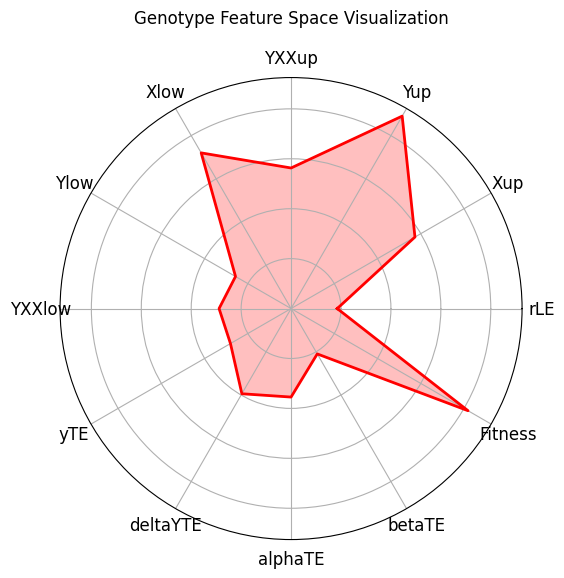

In [527]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from math import pi

# Assuming 'df' is your DataFrame

# Normalize the data
df_normalized = (df - df.min()) / (df.max() - df.min())

# Calculate the mean of each column
df_mean = df_normalized.mean().reset_index()

# Set up the radar chart
num_vars = len(df_mean)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # complete the loop

# The plot is made in a circular (not polygon) coordinate system, so we need to repeat the first value at the end.
values = df_mean.iloc[:, 1].tolist()
values += values[:1]

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, values, color='red', alpha=0.25)
ax.plot(angles, values, color='red', linewidth=2)  # Change the color if you wish

# Labels for each point
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(df_mean['index'], fontsize=12)

# Title
ax.set_title('Genotype Feature Space Visualization', y=1.1)

plt.show()


55it [00:00, 728.38it/s]


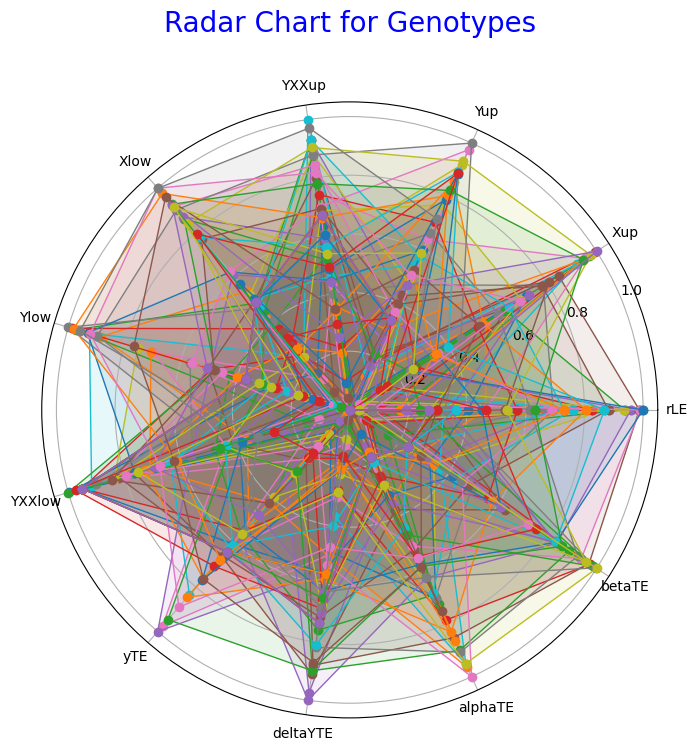

In [549]:
# Normalize the DataFrame except for the Fitness column
df_normalized = df.drop(columns='Fitness')
df_normalized = (df_normalized - df_normalized.min()) / (df_normalized.max() - df_normalized.min())
df_normalized['Fitness'] = df['Fitness']  # Add the Fitness column back

# Prepare the data for a radar chart
labels=np.array(df_normalized.columns[:-1])  # labels for the axes, excluding Fitness
num_vars = len(labels)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

# Radar chart plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Draw one dot per variable and join them with a line for each individual entry in the DataFrame
for idx, row in tqdm(df_normalized.iterrows()):
    data = row.drop('Fitness').tolist()
    data += data[:1]  # Repeat the first value to close the loop
    fitness = row['Fitness']
    ax.plot(angles, data, 'o-', linewidth=1, label=f"Fitness: {fitness:.2f}")
    ax.fill(angles, data, alpha=0.1)

# Draw labels for each category
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Add a title and a legend with some customizations
ax.set_title('Radar Chart for Genotypes', size=20, color='blue', y=1.1)
# ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

# Show the plot
plt.show()

55it [00:00, 655.48it/s]


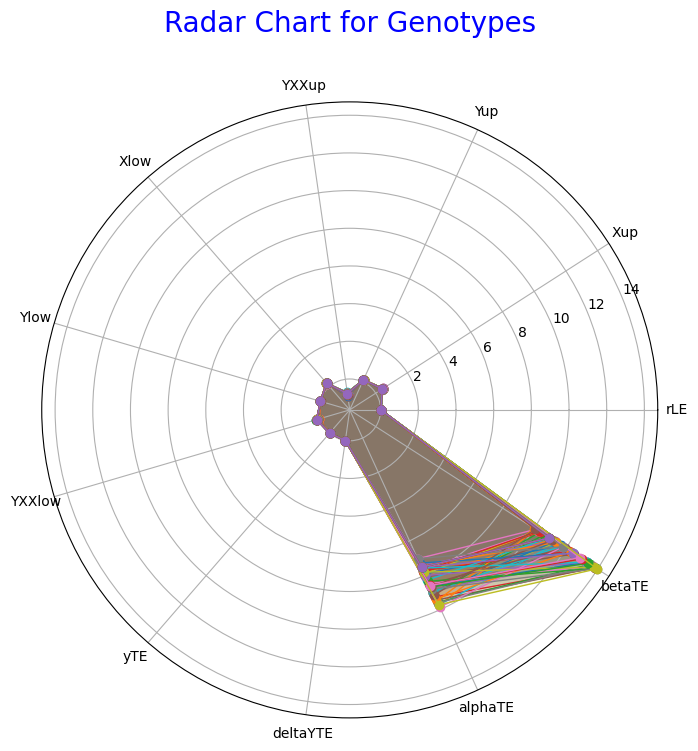

In [550]:
# Normalize the DataFrame except for the Fitness column
df_normalized = df.drop(columns='Fitness')
df_normalized = (df_normalized - df_normalized.min()) / (df_normalized.max() - df_normalized.min())
df_normalized = df.copy()
df_normalized['Fitness'] = df['Fitness']  # Add the Fitness column back

# Prepare the data for a radar chart
labels=np.array(df_normalized.columns[:-1])  # labels for the axes, excluding Fitness
num_vars = len(labels)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

# Radar chart plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Draw one dot per variable and join them with a line for each individual entry in the DataFrame
for idx, row in tqdm(df_normalized.iterrows()):
    data = row.drop('Fitness').tolist()
    data += data[:1]  # Repeat the first value to close the loop
    fitness = row['Fitness']
    ax.plot(angles, data, 'o-', linewidth=1, label=f"Fitness: {fitness:.2f}")
    ax.fill(angles, data, alpha=0.1)

# Draw labels for each category
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Add a title and a legend with some customizations
ax.set_title('Radar Chart for Genotypes', size=20, color='blue', y=1.1)
# ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

# Show the plot
plt.show()

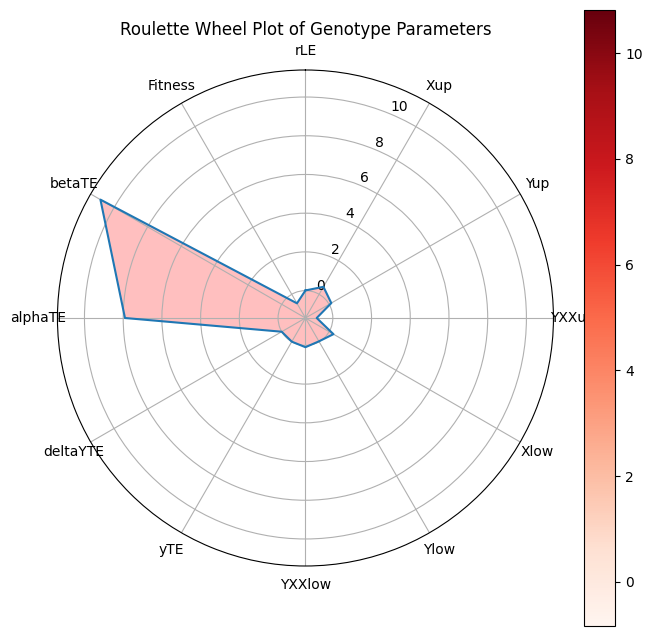

In [514]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming 'df' is your DataFrame and it's already normalized

# Calculate the mean of each column to represent in the wheel
df_mean = df.mean()

# Number of variables we're plotting.
num_vars = len(df_mean)

# Split the circle into even parts and save the angles
# so we know where to put each axis.
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end.
values = df_mean.tolist()
values += values[:1]
angles += angles[:1]

# Draw the plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)

# Draw one axe per variable and add labels
plt.xticks(angles[:-1], df.columns.tolist())

# Draw the outline of our data.
ax.plot(angles, values)

# Fill in the area plotted in the last line
ax.fill(angles, values, 'red', alpha=0.25)

# Make the labels go clockwise
ax.set_theta_direction(-1)

# Draw a color bar with the label.
sm = plt.cm.ScalarMappable(cmap="Reds", norm=plt.Normalize(vmin=min(values), vmax=max(values)))
sm._A = []
plt.colorbar(sm, ax=ax)

# Give the plot a title and show it
ax.set_title('Roulette Wheel Plot of Genotype Parameters')
plt.show()


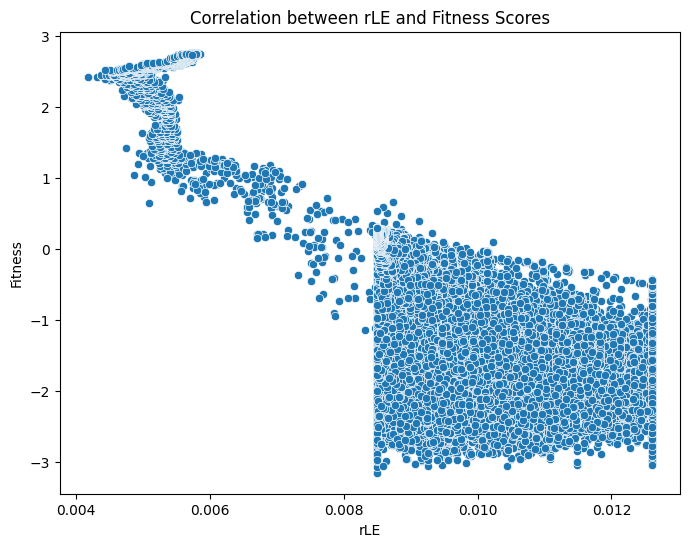

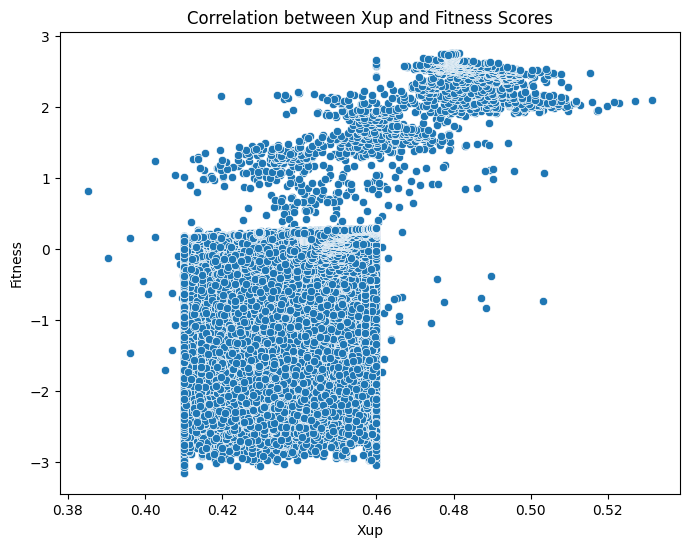

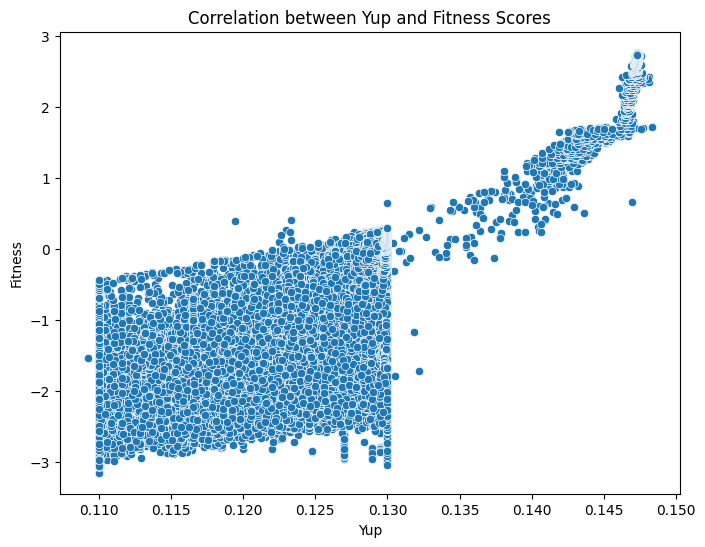

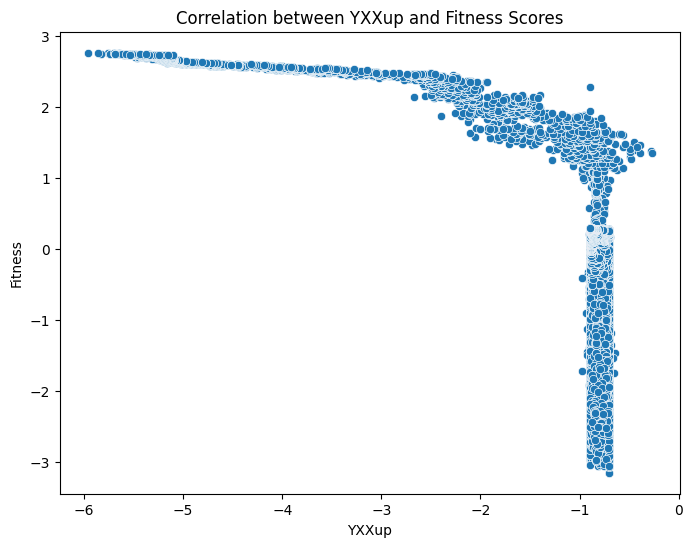

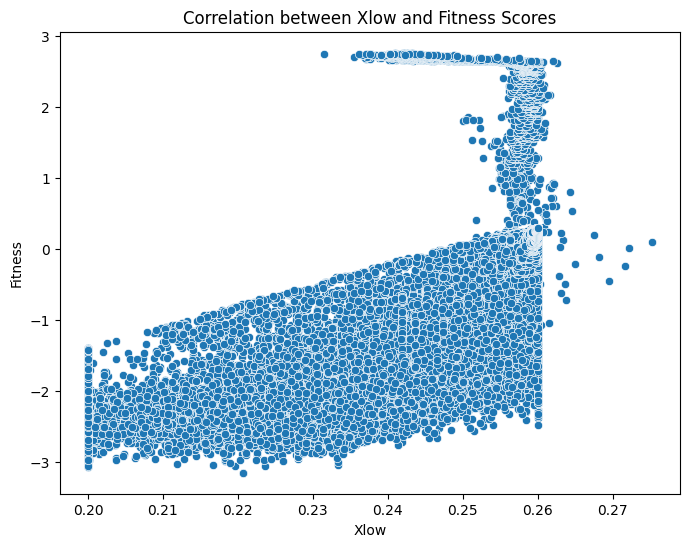

...

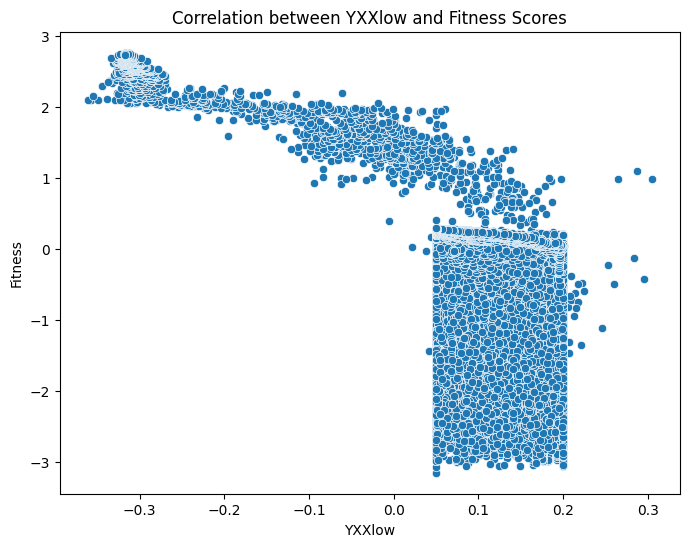

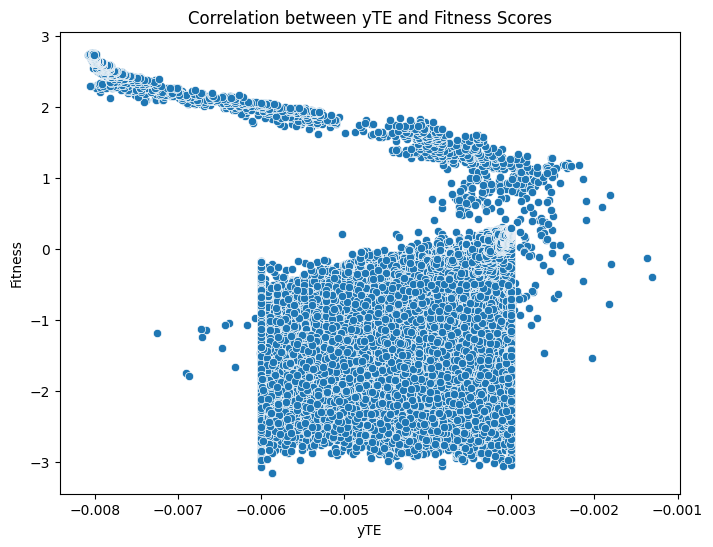

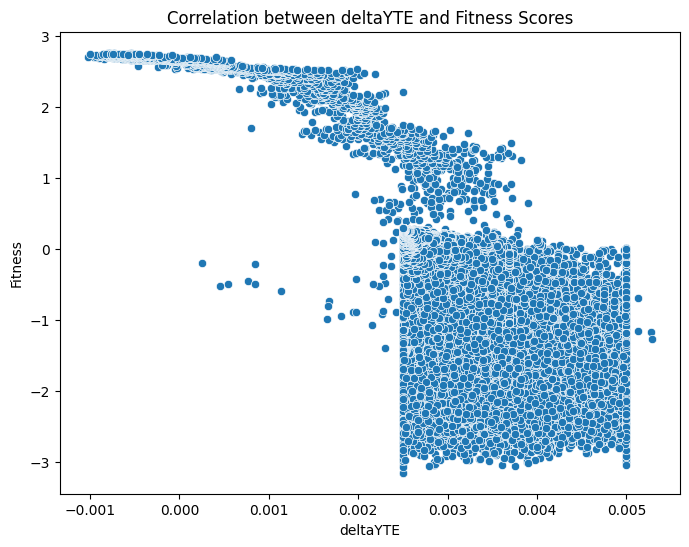

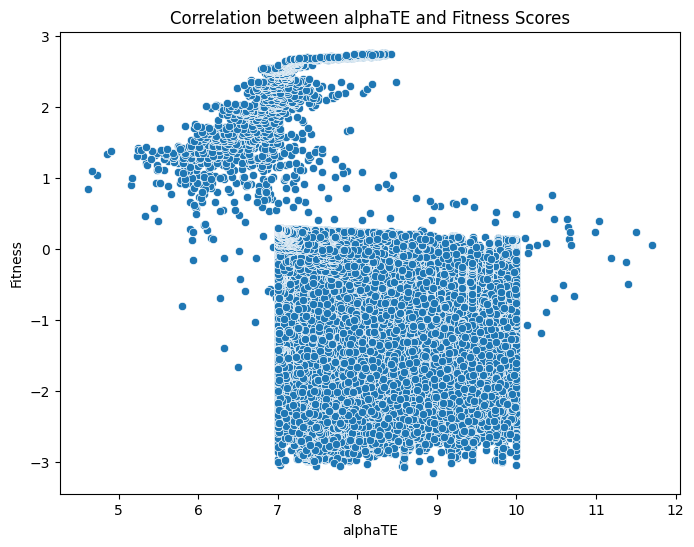

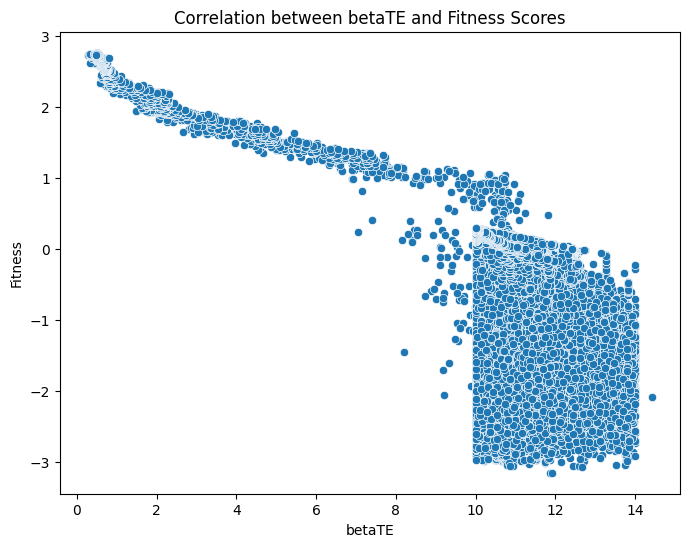

In [412]:
# Create scatter plots
parameter_names = ['rLE', 'Xup', 'Yup', 'YXXup', 'Xlow', 'Ylow', 'YXXlow', 'yTE', 'deltaYTE', 'alphaTE', 'betaTE']
for param in parameter_names:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df, x=param, y='Fitness')
    plt.title(f'Correlation between {param} and Fitness Scores')
    plt.xlabel(param)
    plt.ylabel('Fitness')
    plt.show()

In [413]:
from pandas.plotting import parallel_coordinates

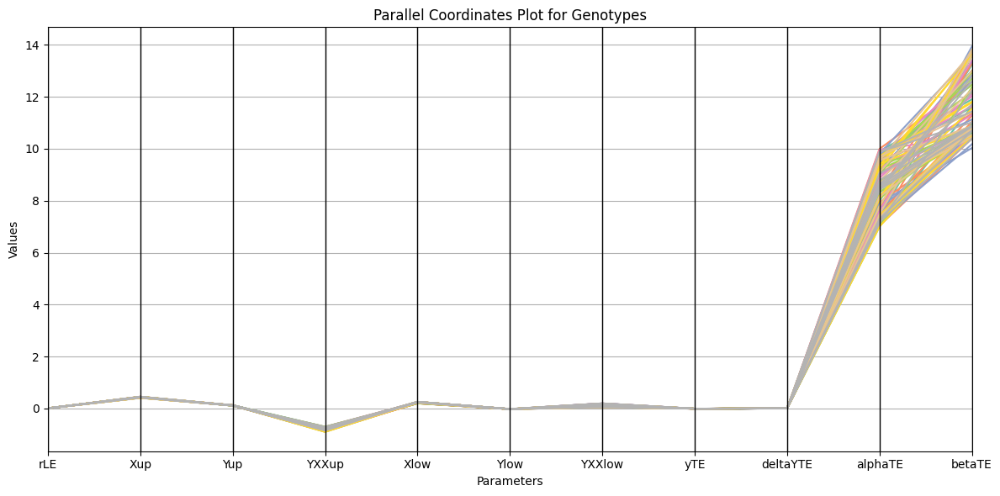

In [428]:
plt.figure(figsize=(12, 6))
parallel_coordinates(df[:100], 'Fitness', colormap=plt.get_cmap("Set2"), color=None)

plt.title('Parallel Coordinates Plot for Genotypes')
plt.xlabel('Parameters')
plt.ylabel('Values')
plt.grid(True)

# Suppress the color legend by not passing any label information
plt.legend().remove()  # This line can be uncommented if the legend still appears

# Show the plot
plt.tight_layout()  # This can help with layout issues
plt.show()

In [429]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181362 entries, 0 to 181361
Data columns (total 12 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   rLE       181362 non-null  float64
 1   Xup       181362 non-null  float64
 2   Yup       181362 non-null  float64
 3   YXXup     181362 non-null  float64
 4   Xlow      181362 non-null  float64
 5   Ylow      181362 non-null  float64
 6   YXXlow    181362 non-null  float64
 7   yTE       181362 non-null  float64
 8   deltaYTE  181362 non-null  float64
 9   alphaTE   181362 non-null  float64
 10  betaTE    181362 non-null  float64
 11  Fitness   181362 non-null  float64
dtypes: float64(12)
memory usage: 16.6 MB


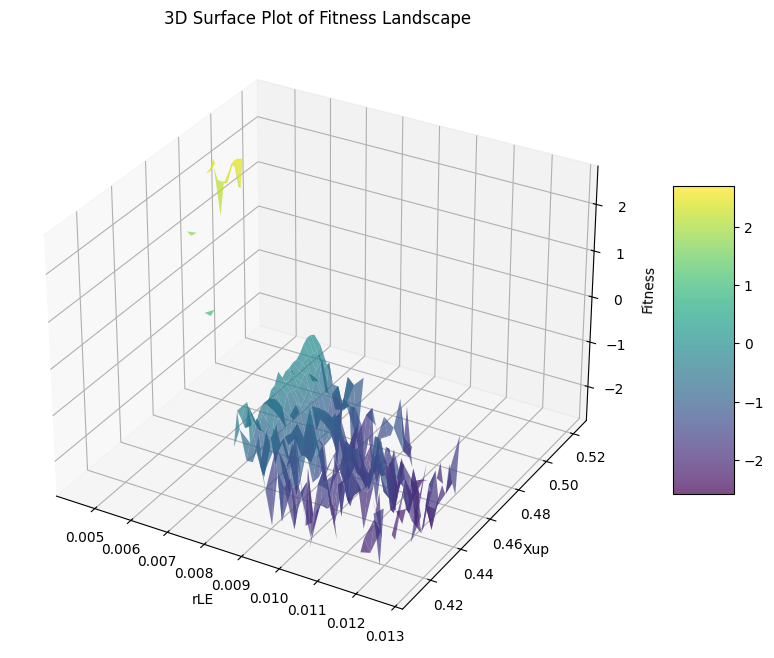

In [430]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Example parameters
param1 = 'rLE'
param2 = 'Xup'

# Sample a subset of the DataFrame for visualization purposes
sampled_df = df.sample(n=5000, random_state=1)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a grid of values
x = np.linspace(sampled_df[param1].min(), sampled_df[param1].max(), num=50)
y = np.linspace(sampled_df[param2].min(), sampled_df[param2].max(), num=50)
x, y = np.meshgrid(x, y)

# Interpolating z values
def interpolate_z(xi, yi, df):
    filtered_df = df[(df[param1] >= xi - dx/2) & (df[param1] < xi + dx/2) & 
                     (df[param2] >= yi - dy/2) & (df[param2] < yi + dy/2)]
    if filtered_df.empty:
        return np.nan
    else:
        return filtered_df['Fitness'].mean()

dx = (sampled_df[param1].max() - sampled_df[param1].min()) / 50
dy = (sampled_df[param2].max() - sampled_df[param2].min()) / 50
z = np.array([interpolate_z(xi, yi, sampled_df) for xi, yi in zip(np.ravel(x), np.ravel(y))]).reshape(x.shape)

# Plotting the surface
surf = ax.plot_surface(x, y, z, cmap='viridis', edgecolor='none', alpha=0.7)

# Labels and title
ax.set_xlabel(param1)
ax.set_ylabel(param2)
ax.set_zlabel('Fitness')
ax.set_title('3D Surface Plot of Fitness Landscape')

# Adding a color bar
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

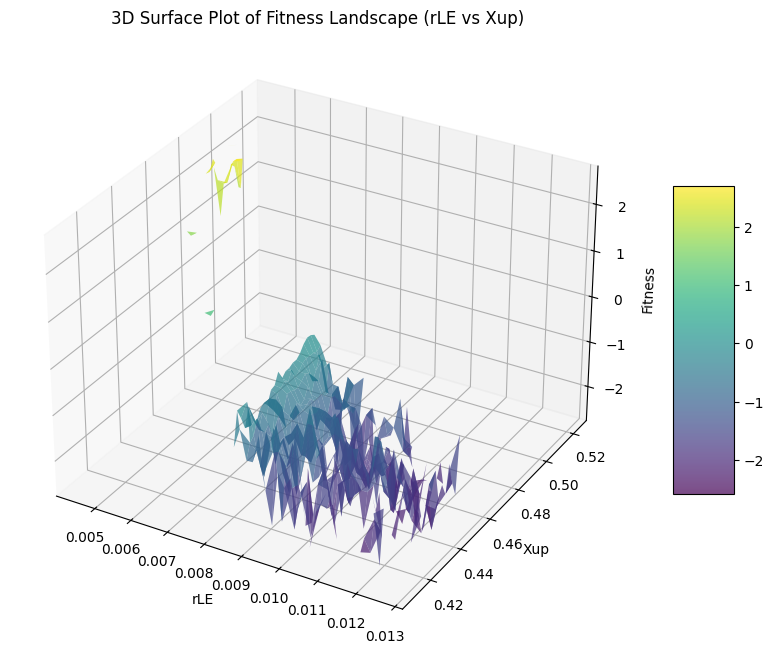

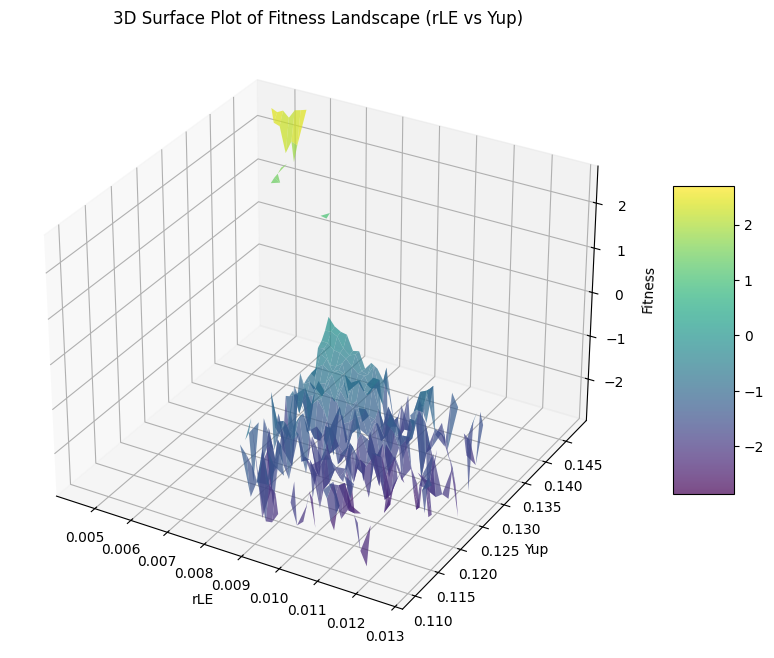

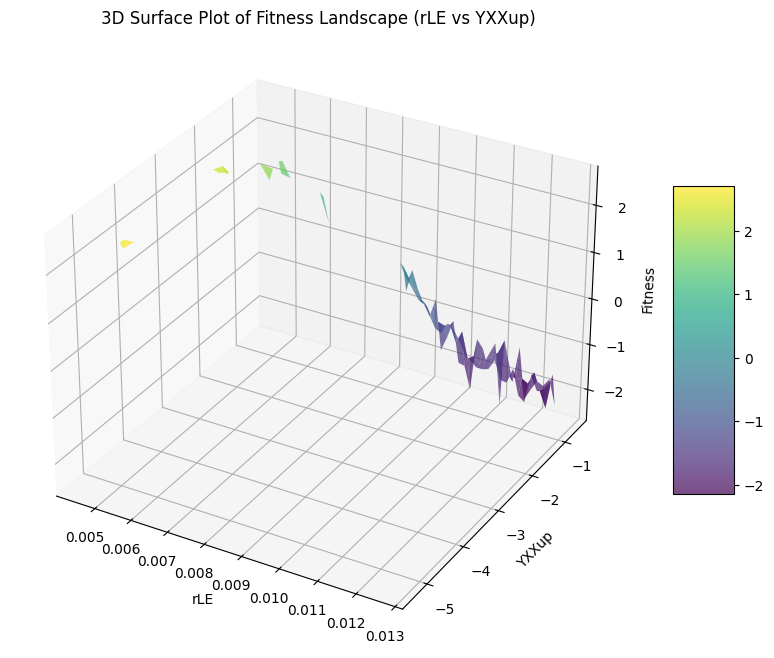

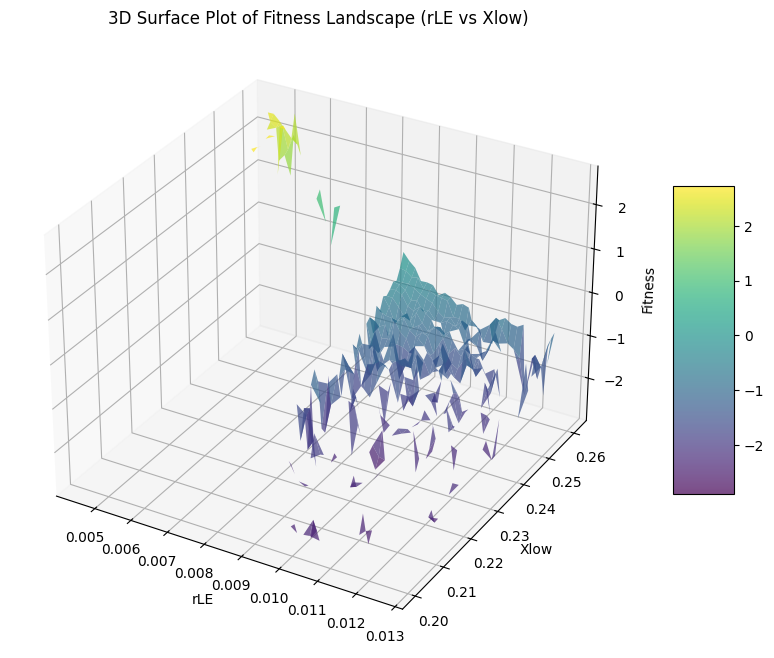

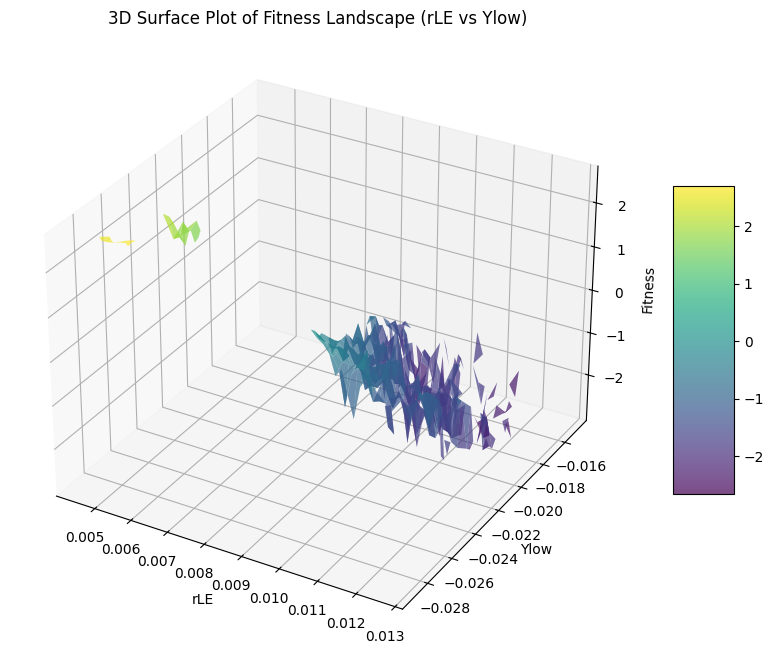

...

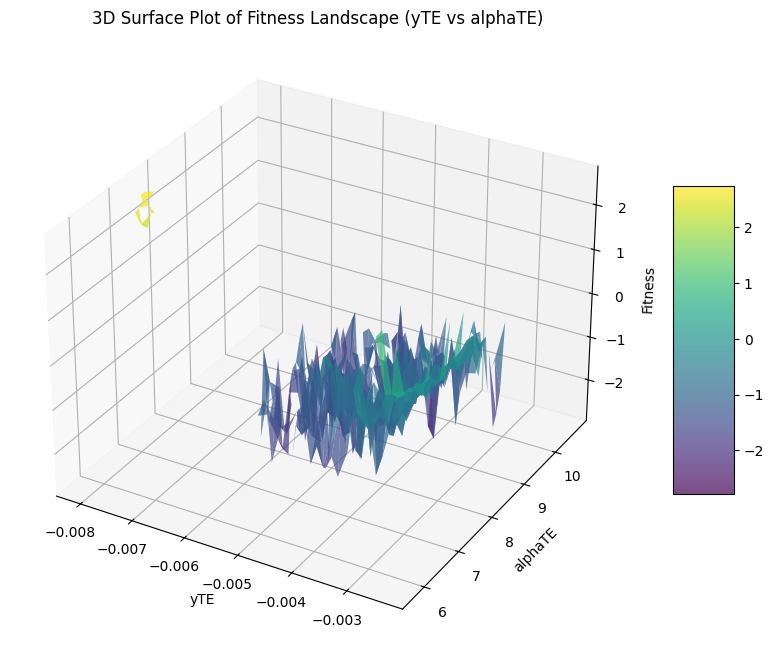

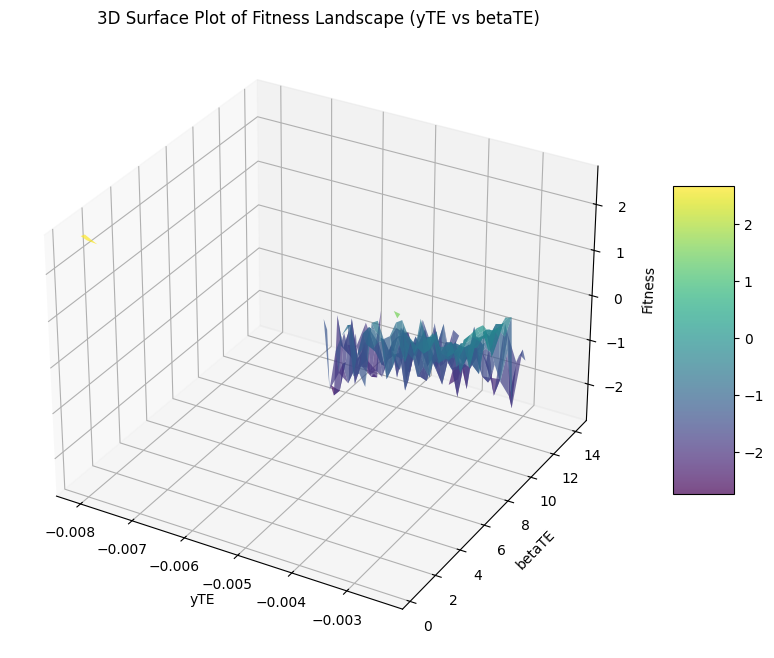

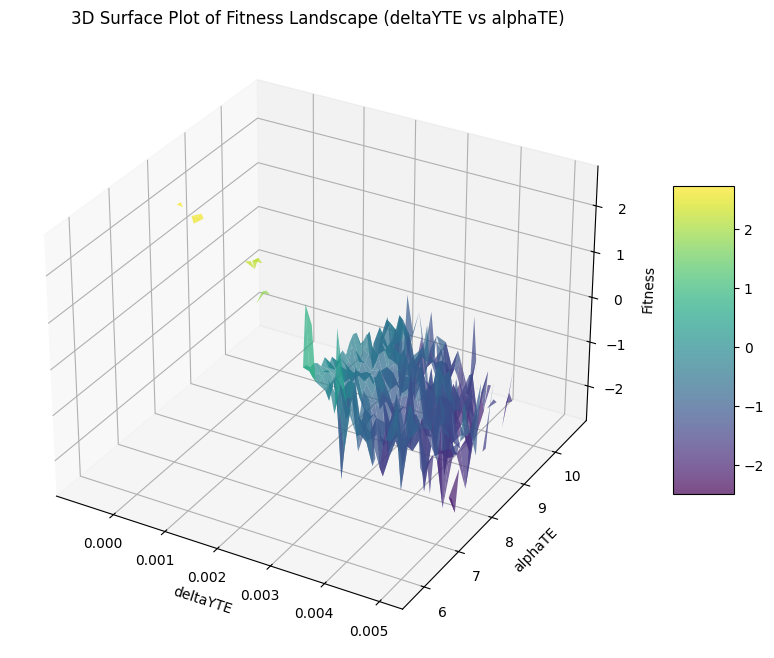

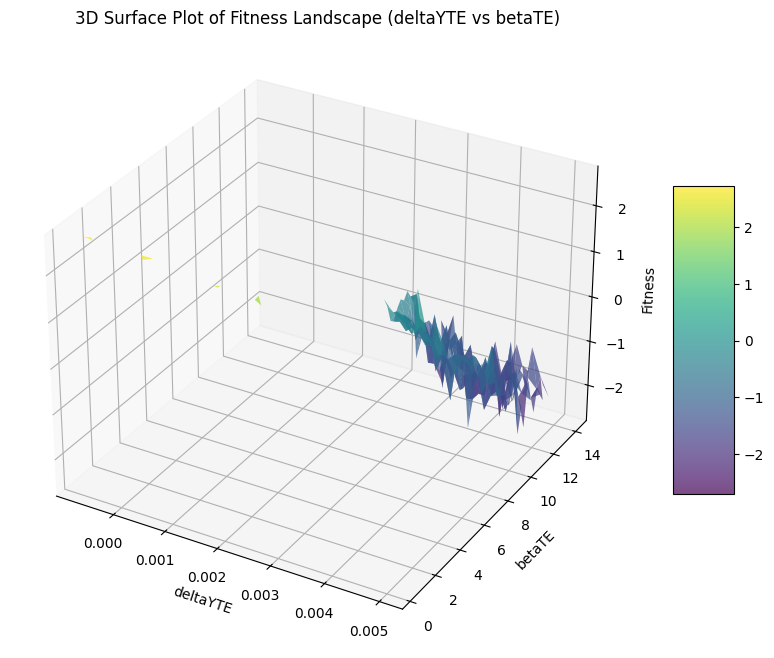

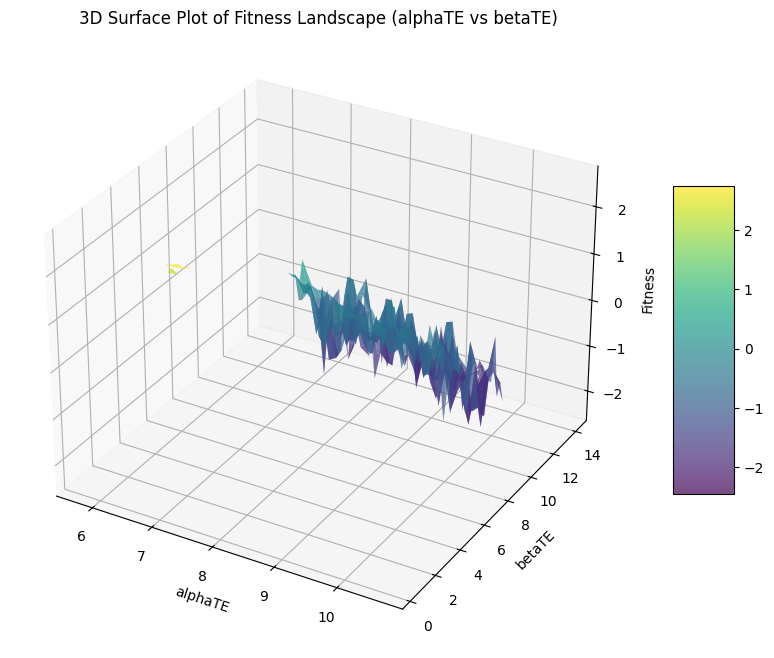

In [431]:
from itertools import combinations

# List of all parameters for which you want to create plots
parameters = ['rLE', 'Xup', 'Yup', 'YXXup', 'Xlow', 'Ylow', 'YXXlow', 'yTE', 'deltaYTE', 'alphaTE', 'betaTE']

# Generating all unique pairs of parameters
parameter_pairs = list(combinations(parameters, 2))

# Function to create a 3D surface plot for given parameter pair
def plot_3d_surface(df, param1, param2):
    # Sampling a subset of the DataFrame for visualization
    sampled_df = df.sample(n=5000, random_state=1)

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Creating a grid of values
    x = np.linspace(sampled_df[param1].min(), sampled_df[param1].max(), num=50)
    y = np.linspace(sampled_df[param2].min(), sampled_df[param2].max(), num=50)
    x, y = np.meshgrid(x, y)

    # Interpolating z values
    def interpolate_z(xi, yi, df):
        filtered_df = df[(df[param1] >= xi - dx/2) & (df[param1] < xi + dx/2) &
                         (df[param2] >= yi - dy/2) & (df[param2] < yi + dy/2)]
        if filtered_df.empty:
            return np.nan
        else:
            return filtered_df['Fitness'].mean()

    dx = (sampled_df[param1].max() - sampled_df[param1].min()) / 50
    dy = (sampled_df[param2].max() - sampled_df[param2].min()) / 50
    z = np.array([interpolate_z(xi, yi, sampled_df) for xi, yi in zip(np.ravel(x), np.ravel(y))]).reshape(x.shape)

    # Plotting the surface
    surf = ax.plot_surface(x, y, z, cmap='viridis', edgecolor='none', alpha=0.7)

    # Labels and title
    ax.set_xlabel(param1)
    ax.set_ylabel(param2)
    ax.set_zlabel('Fitness')
    ax.set_title(f'3D Surface Plot of Fitness Landscape ({param1} vs {param2})')

    # Adding a color bar
    fig.colorbar(surf, shrink=0.5, aspect=5)

    plt.show()

# Loop over each pair and generate a plot
for pair in parameter_pairs:
    plot_3d_surface(df, pair[0], pair[1])